# CNN Visualization Sample
This samepl is from https://github.com/keras-team/keras/blob/master/examples/conv_filter_visualization.py
BUT it is not work when I use udacity's anaconda environment.
**Because version of keras of anaconda is 2.1.6 but this sample have to use 2.2.0.**
And another error when I try to transfer layer block2_conv1 since the size of it is 128.
Since I do some change in the code and hope it is helpful.

In [1]:

from __future__ import print_function

import numpy as np
import time
from keras.preprocessing.image import save_img
from keras.applications import vgg16
from keras import backend as K

# dimensions of the generated pictures for each filter.
img_width = 128
img_height = 128


Using TensorFlow backend.


In [2]:
def deprocess_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + K.epsilon())
    x *= 0.1

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    x *= 255
    if K.image_data_format() == 'channels_first':
        x = x.transpose((1, 2, 0))
    x = np.clip(x, 0, 255).astype('uint8')
    return x

def normalize(x):
    # utility function to normalize a tensor by its L2 norm
    return x / (K.sqrt(K.mean(K.square(x))) + K.epsilon())

In [3]:
model = vgg16.VGG16(weights='imagenet', include_top=False)
print('Model loaded.')

model.summary()

# this is the placeholder for the input images
input_img = model.input

# get the symbolic outputs of each "key" layer (we gave them unique names).
layer_dict = dict([(layer.name, layer) for layer in model.layers[1:]])



Model loaded.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, None, None, 3)     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0      

In [4]:
def output_img(layer_name, layer_dict):
    kept_filters = []
    layer_output = layer_dict[layer_name].output
    min_len = min(layer_output.shape[-1], 200)
    for filter_index in range(min_len):
        # we only scan through the first 200 filters,
        # but there are actually 512 of them
#         print('Processing filter %d' % filter_index)
        start_time = time.time()

        # we build a loss function that maximizes the activation
        # of the nth filter of the layer considered
        layer_output = layer_dict[layer_name].output
        if K.image_data_format() == 'channels_first':
            loss = K.mean(layer_output[:, filter_index, :, :])
        else:
            loss = K.mean(layer_output[:, :, :, filter_index])

        # we compute the gradient of the input picture wrt this loss
        grads = K.gradients(loss, input_img)[0]

        # normalization trick: we normalize the gradient
        grads = normalize(grads)

        # this function returns the loss and grads given the input picture
        iterate = K.function([input_img], [loss, grads])

        # step size for gradient ascent
        step = 1.

        # we start from a gray image with some random noise
        if K.image_data_format() == 'channels_first':
            input_img_data = np.random.random((1, 3, img_width, img_height))
        else:
            input_img_data = np.random.random((1, img_width, img_height, 3))
        input_img_data = (input_img_data - 0.5) * 20 + 128

        # we run gradient ascent for 20 steps
        for i in range(20):
            loss_value, grads_value = iterate([input_img_data])
            input_img_data += grads_value * step

#             print('Current loss value:', loss_value)
            if loss_value <= 0.:
                # some filters get stuck to 0, we can skip them
                break

        # decode the resulting input image
        if loss_value > 0:
            img = deprocess_image(input_img_data[0])
            kept_filters.append((img, loss_value))
        end_time = time.time()
#         print('Filter %d processed in %ds' % (filter_index, end_time - start_time))

    # we will stich the best 64 filters on a 8 x 8 grid.
    n = 8

    # the filters that have the highest loss are assumed to be better-looking.
    # we will only keep the top 64 filters.
    kept_filters.sort(key=lambda x: x[1], reverse=True)
    kept_filters = kept_filters[:n * n]
    kept_filters_maxlen = len(kept_filters)
#     print(kept_filters_maxlen)

    # build a black picture with enough space for
    # our 8 x 8 filters of size 128 x 128, with a 5px margin in between
    margin = 5
    width = n * img_width + (n - 1) * margin
    height = n * img_height + (n - 1) * margin
    stitched_filters = np.zeros((width, height, 3))

    # fill the picture with our saved filters
    for i in range(n):
        for j in range(n):
#             img, loss = kept_filters[i * n + j]
#             print(i * n + j)
            if (i * n + j) >= kept_filters_maxlen:
                break
            img, loss = kept_filters[i * n + j]
            stitched_filters[(img_width + margin) * i: (img_width + margin) * i + img_width,
                             (img_height + margin) * j: (img_height + margin) * j + img_height, :] = img

    # save the result to disk
    filename = layer_name + 'stitched_filters_%dx%d.png' % (n, n)
    save_img(filename, stitched_filters)
    return filename

In [6]:
# this section have to run couples hours in my mac. 
# Don;t run it if you just want to see the result of vgg16
output_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']
img_files = []
for i in range(len(output_layers)):
    f = output_img(output_layers[i], layer_dict)
    print(f)
    img_files.append(f)

block1_conv1stitched_filters_8x8.png
block2_conv1stitched_filters_8x8.png
block3_conv1stitched_filters_8x8.png
block4_conv1stitched_filters_8x8.png
block5_conv1stitched_filters_8x8.png


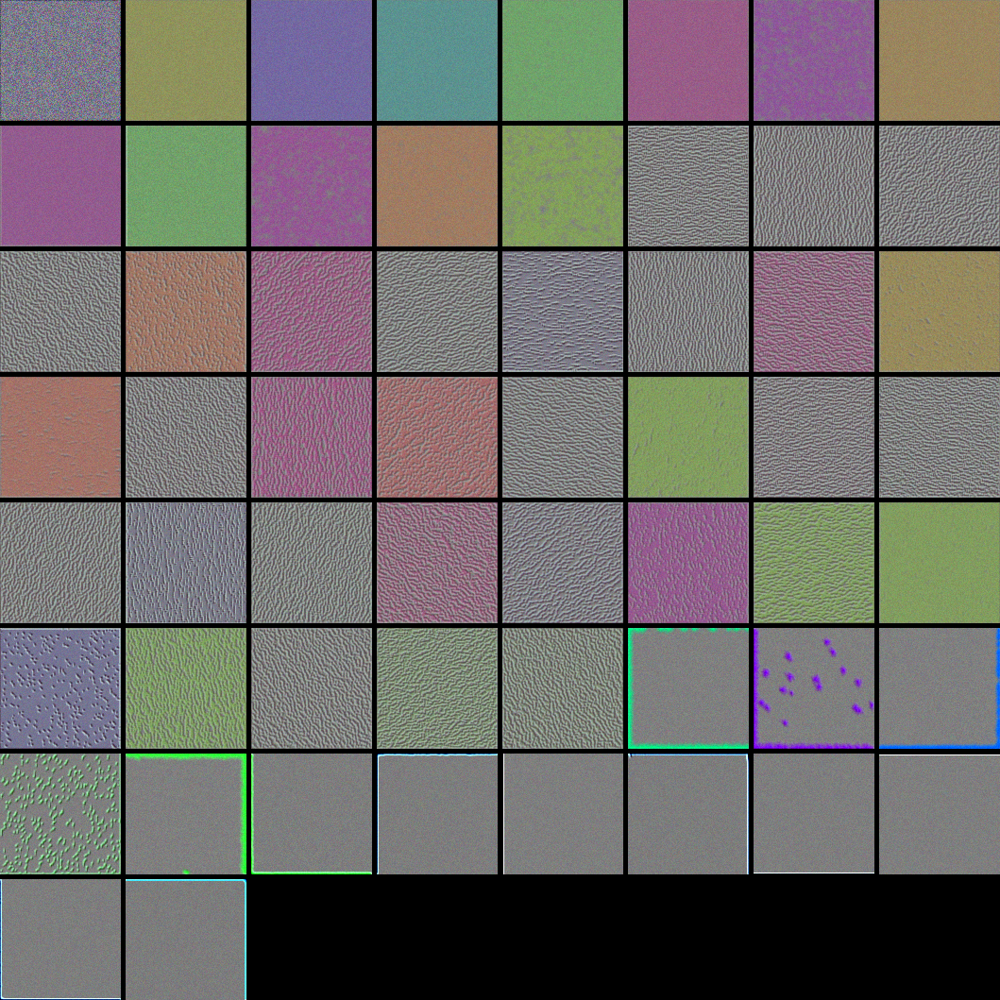

In [9]:
from IPython.display import Image
Image(filename='block1_conv1stitched_filters_8x8.png')

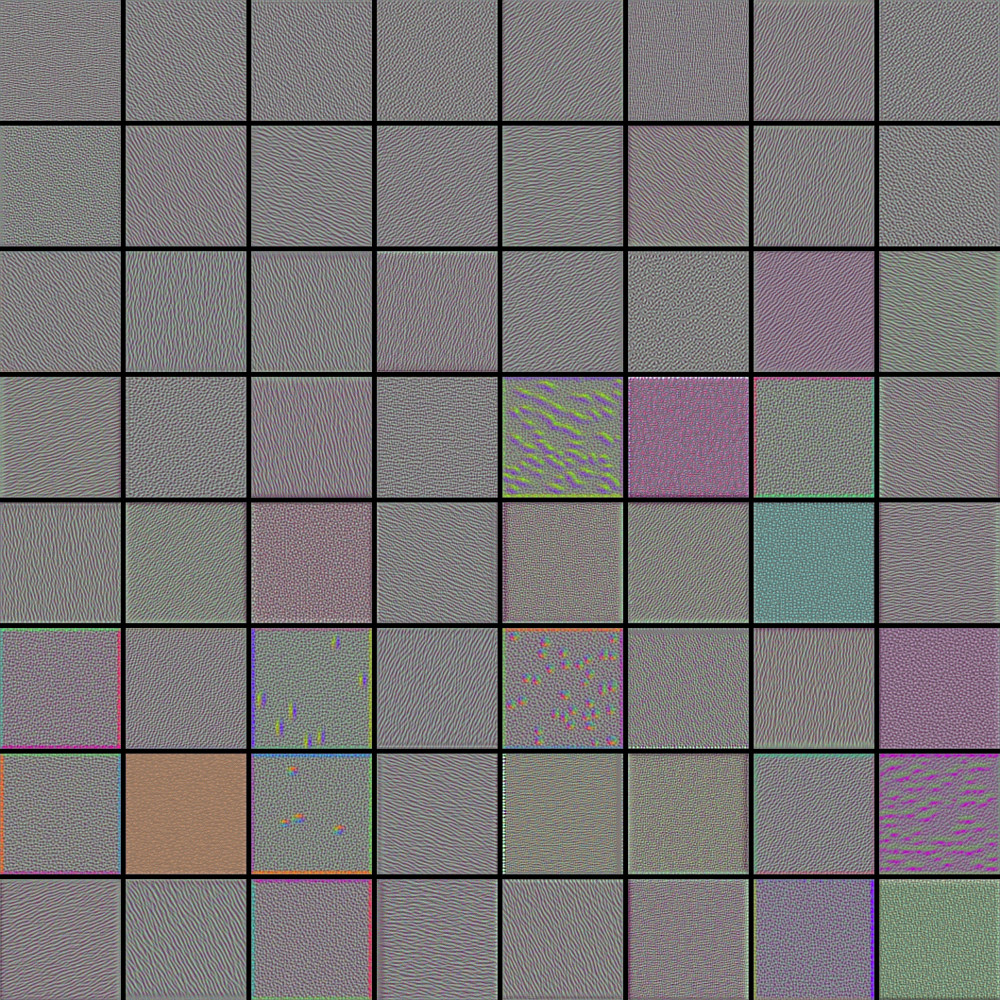

In [10]:
Image(filename='block2_conv1stitched_filters_8x8.png')

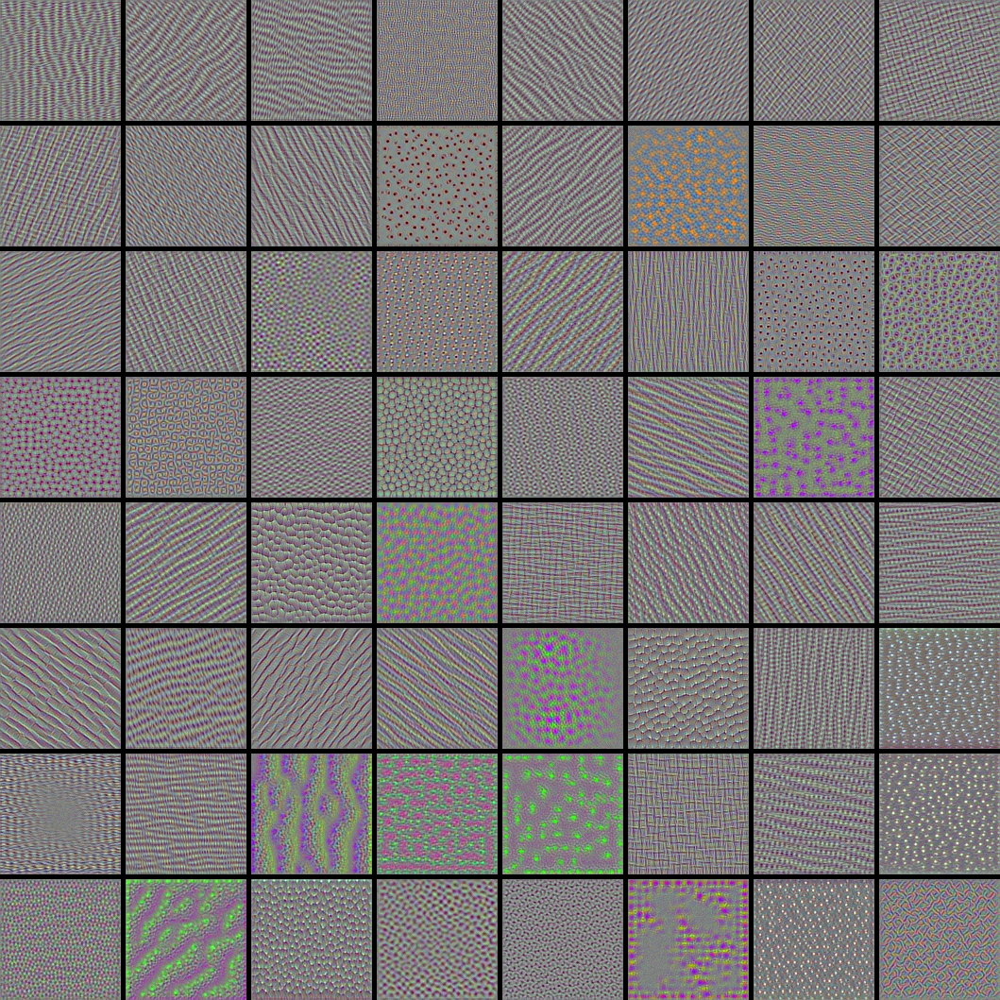

In [11]:
Image(filename='block3_conv1stitched_filters_8x8.png')

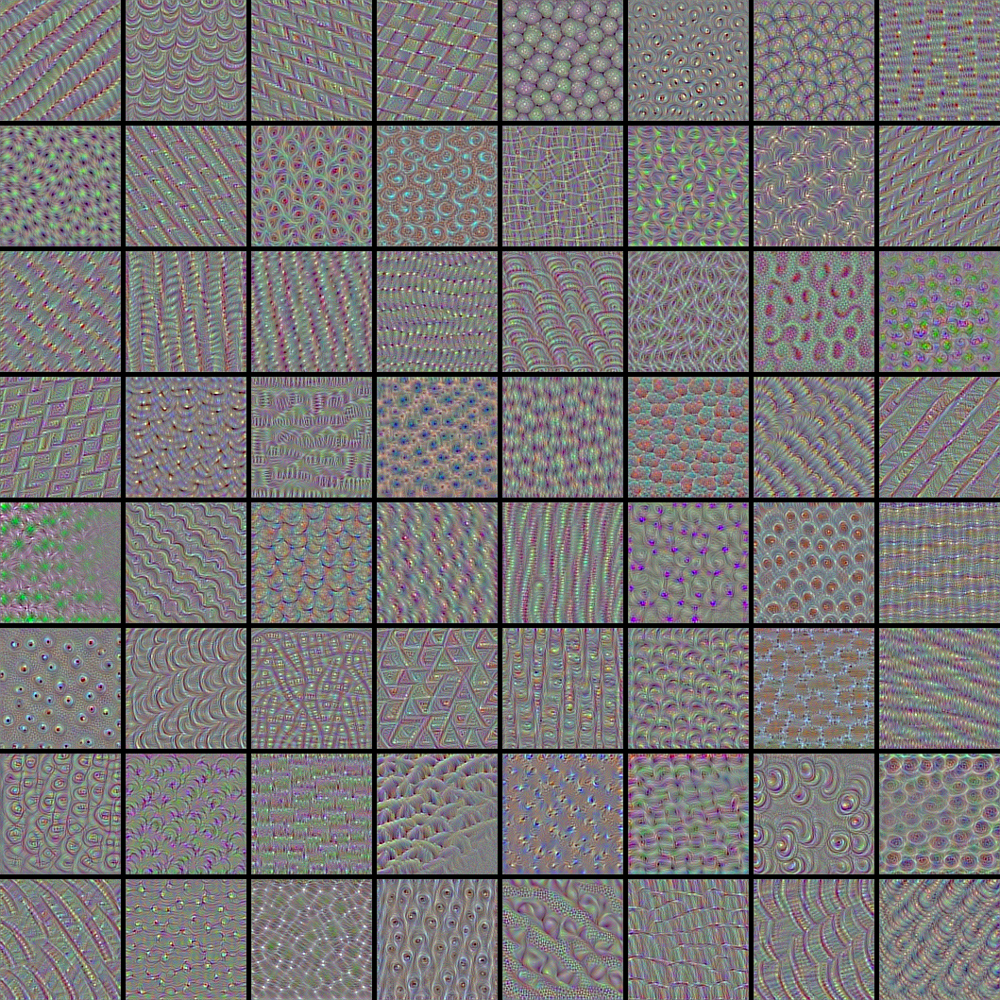

In [12]:
Image(filename='block4_conv1stitched_filters_8x8.png')

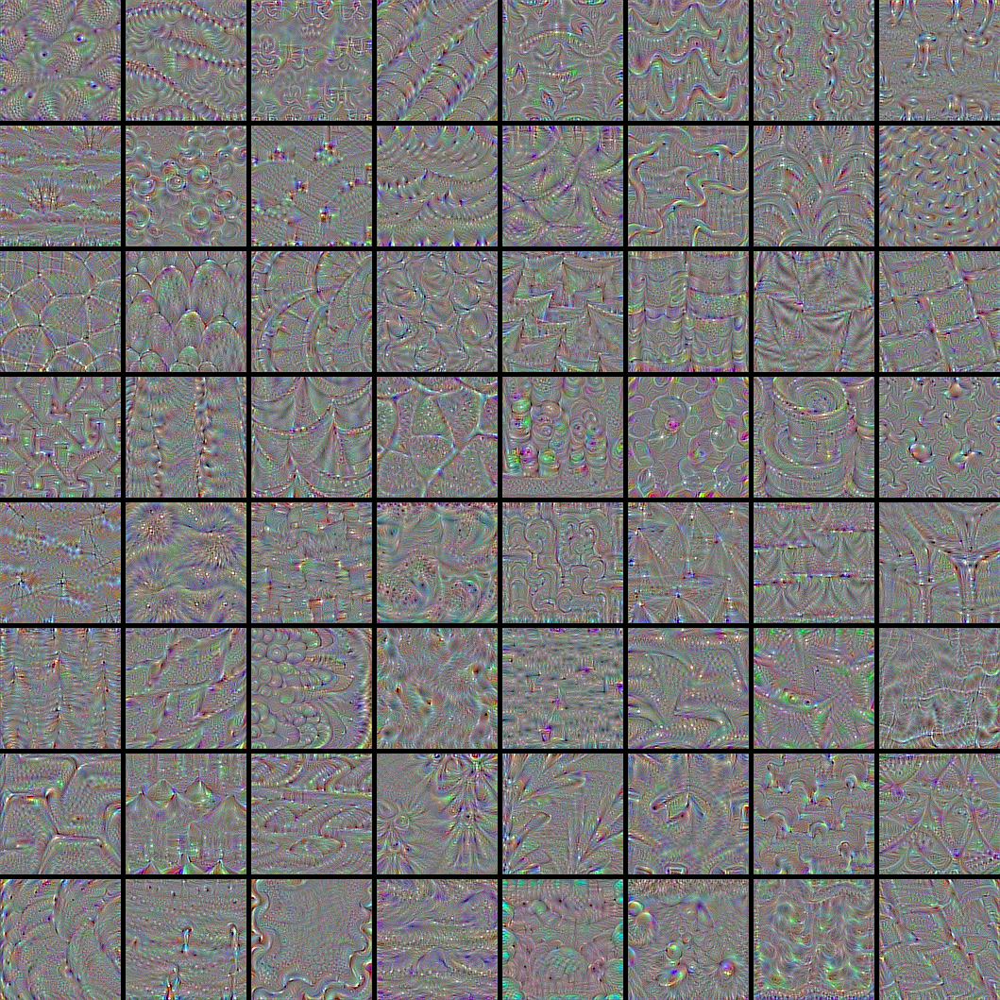

In [13]:
Image(filename='block5_conv1stitched_filters_8x8.png')